# **CS 4363/5363 Computer Vision**

**Image Matching using ORB**

**Author:** [Olac Fuentes](http://www.cs.utep.edu/ofuentes/)<br>
**Last modified:** 3/25/2025<br>

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from skimage import transform as tr

def display_control_lines(im0,im1,pts0, pts1, n=np.inf):
    n = min(n,pts0.shape[0])
    clr_str = 'rgbycmwb'
    canvas_shape = (max(im0.shape[0],im1.shape[0]),im0.shape[1]+im1.shape[1],3)
    canvas = np.zeros(canvas_shape)
    canvas[:im0.shape[0],:im0.shape[1]] = im0/255
    canvas[:im1.shape[0],im0.shape[1]:canvas.shape[1]]= im1/255
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.imshow(canvas)
    ax.axis('off')
    pts2 = pts1+np.array([im0.shape[1],0])
    for i in range(n):
        ax.plot([pts0[i,0],pts2[i,0]],[pts0[i,1],pts2[i,1]],color=clr_str[i%len(clr_str)],linewidth=0.4)
    plt.show()

def get_keypoints_and_descriptors(img):
    orb = cv.ORB_create()
    gray = cv.cvtColor(img[:,:,::-1],cv.COLOR_BGR2GRAY)
    keypoints, descriptors = orb.detectAndCompute(gray,mask=None)
    keypoints = np.float32([k.pt for k in keypoints])
    return keypoints, descriptors

def match_descriptors(src_desc,dst_desc,max_matches = 100):
    matcher = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
    matches = matcher.match(src_desc,dst_desc)
    dist = np.array([m.distance for m in matches])
    a = np.argsort(dist)[:max_matches]
    src_index = [matches[i].queryIdx for i in a]
    dst_index = [matches[i].trainIdx for i in a]
    return np.array(src_index), np.array(dst_index), dist[a]


In [ ]:
!ls

sample_data  WF01.jpg  WF02.jpg  WF03.jpg


In [ ]:
source_img = plt.imread('WF01.jpg')
dest_img = plt.imread('WF02.jpg')

#Examples

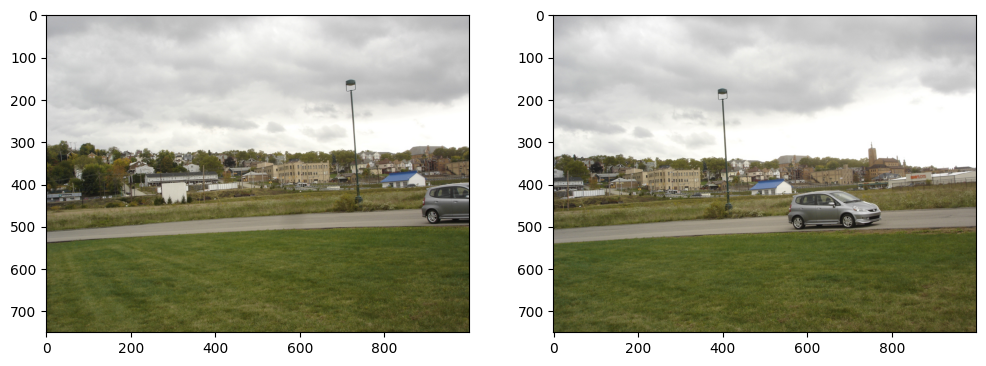

In [ ]:
fig, ax = plt.subplots(ncols=2,figsize=(12, 6))
ax[0].imshow(source_img)
ax[1].imshow(dest_img)

Now let's find the keypoints and descriptors of each image

In [ ]:
src_kp, src_desc = get_keypoints_and_descriptors(source_img)
dst_kp, dst_desc = get_keypoints_and_descriptors(dest_img)

In [ ]:
src_desc[0]

array([ 58, 169,  33,  27,  95, 217, 128, 105,  79,   1, 233, 147, 138,
       200,  60, 164, 200, 187, 194, 129,  30, 187, 110, 213,  31, 116,
       154,  95,  87,  14, 254, 134], dtype=uint8)

In [ ]:
print(f'{src_kp.shape = }')
print(f'{dst_kp.shape = }')
print(f'{src_desc.shape = }')
print(f'{dst_desc.shape = }')

src_kp.shape = (500, 2)
dst_kp.shape = (500, 2)
src_desc.shape = (500, 32)
dst_desc.shape = (500, 32)


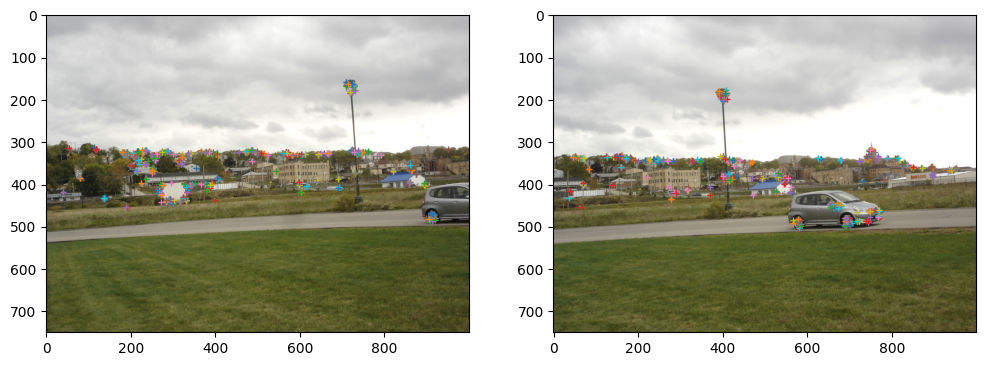

In [ ]:
fig, ax = plt.subplots(ncols=2,figsize=(12, 6))
ax[0].imshow(source_img)
ax[1].imshow(dest_img)
for i in range(src_kp.shape[0]):
    ax[0].plot(src_kp[i,0],src_kp[i,1],'+',markersize=4)
    ax[1].plot(dst_kp[i,0],dst_kp[i,1],'+',markersize=4)

Each descriptor is an array of 32 integers describing a region in an image.
Each keypoint contains the (x,y) locations of the corresponding descriptor. For example src_desc[0] describes the region in the source image located around pixel src_kp[0] in source image, that is, around pixel *source_img[src_kp[0,1], src_kp[0,0]]*.

To match the images, we find, for every descriptor in the source image, the most similar descriptor in the destination image.

This is a complicated problem, as not all interest points in the source image are present in the destination image, and viceversa.

We will use the matcher provided by OpenCV and the wrapper function in the first cell. It returns the indices of the matches, so that src_desc[src_index[i]] matches dst_desc[dst_index[i]]

In [ ]:
src_index, dst_index, dist = match_descriptors(src_desc,dst_desc,max_matches=500)

In [ ]:
print(f'{src_index.shape = }')
print(f'{dst_index.shape = }')
print(f'{dist.shape = }')

src_index.shape = (221,)
dst_index.shape = (221,)
dist.shape = (221,)


In [ ]:
src_index[:10]

array([226, 278, 143,  23, 286, 279, 276, 108, 117, 201])

In [ ]:
dst_index[:10]

array([228, 276, 184,  40, 322, 277, 301,   8, 188, 254])

In [ ]:
dist[:10]

array([10., 11., 12., 12., 12., 12., 12., 12., 13., 13.])

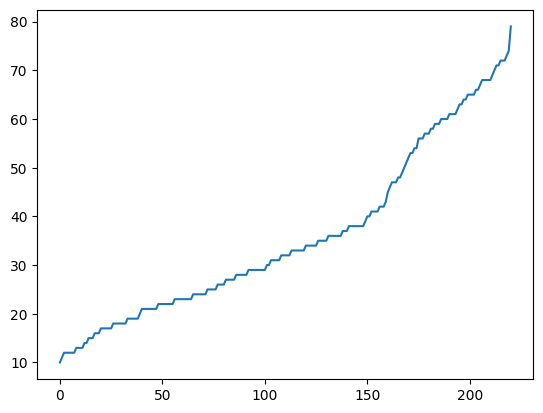

In [ ]:
plt.plot(dist)

Here's the closest match:

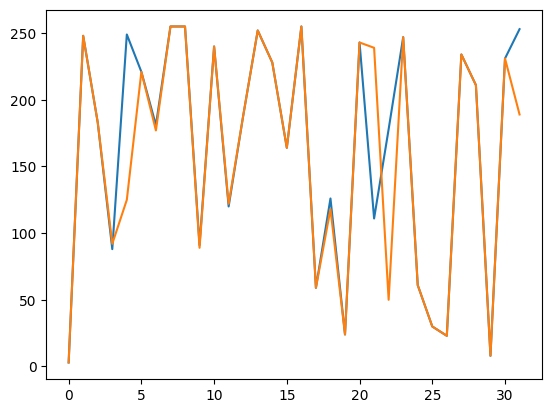

In [ ]:
plt.plot(src_desc[src_index[0]])
plt.plot(dst_desc[dst_index[0]])

Here's the worst match:

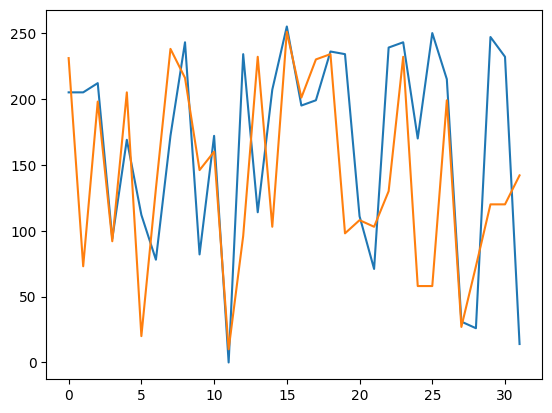

In [ ]:
plt.plot(src_desc[src_index[-1]])
plt.plot(dst_desc[dst_index[-1]])

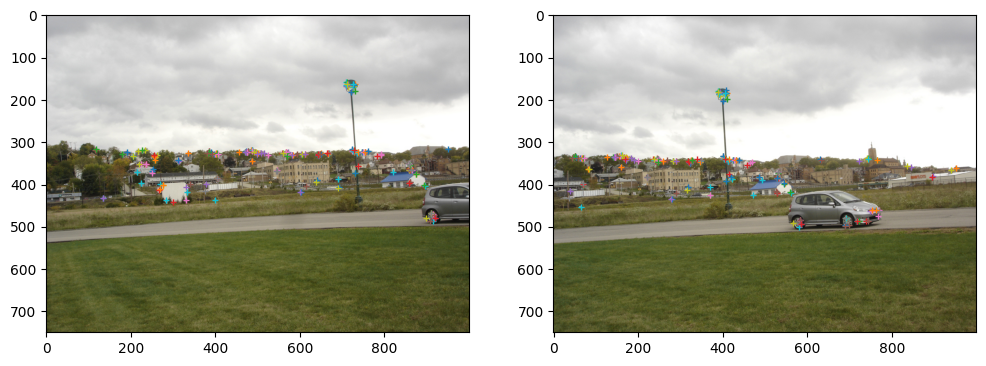

In [ ]:
src_kp = src_kp[src_index]
src_desc = src_desc[src_index]

dst_kp = dst_kp[dst_index]
dst_desc = dst_desc[dst_index]

fig, ax = plt.subplots(ncols=2,figsize=(12, 6))
ax[0].imshow(source_img)
ax[1].imshow(dest_img)
for i in range(src_kp.shape[0]):
    ax[0].plot(src_kp[i,0],src_kp[i,1],'+',markersize=4)
    ax[1].plot(dst_kp[i,0],dst_kp[i,1],'+',markersize=4)

Now lets show the point matches found.

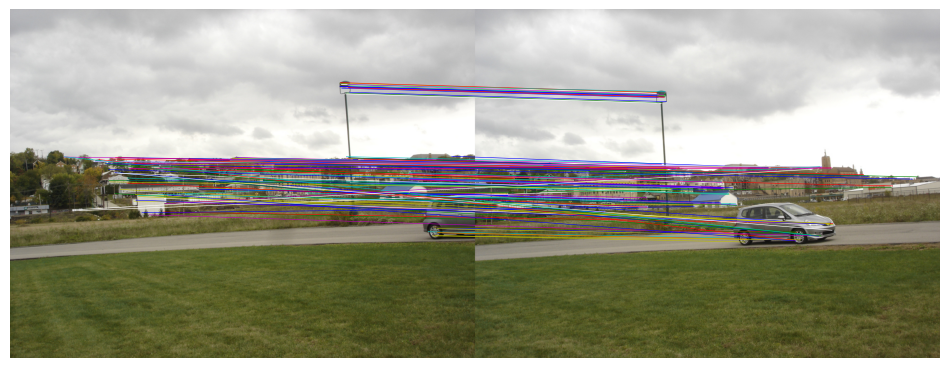

In [ ]:
display_control_lines(source_img,dest_img,src_kp, dst_kp, src_kp.shape[0])

Now let's compute the transformation from the source to the destination image.


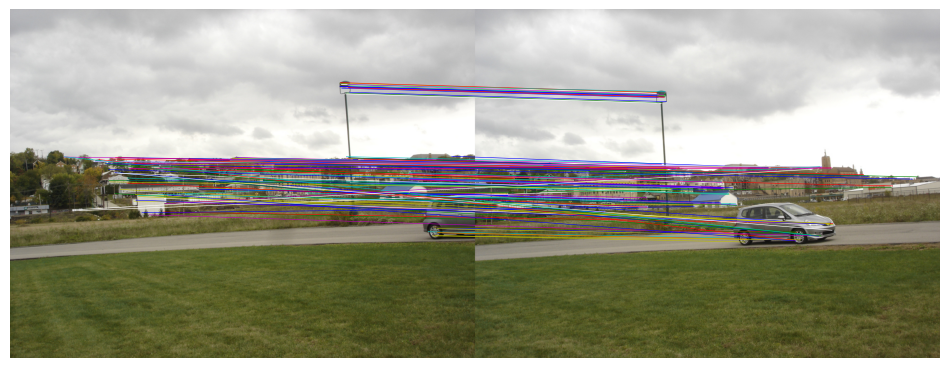

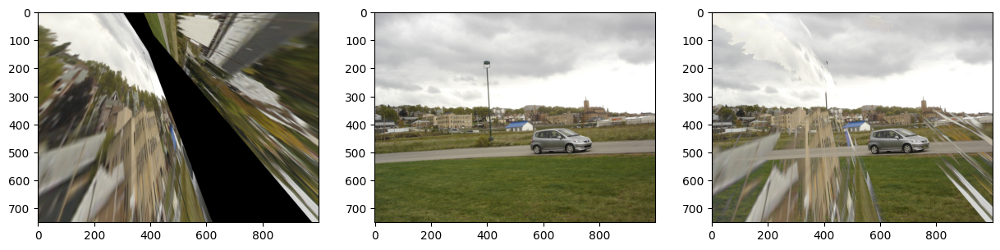

In [ ]:
H = tr.ProjectiveTransform()
H.estimate(src_kp, dst_kp)

display_control_lines(source_img,dest_img,src_kp, dst_kp, src_kp.shape[0])

warped_source_img = tr.warp(source_img, H.inverse,output_shape=dest_img.shape)
fig, ax = plt.subplots(ncols=3,figsize=(15, 6))
ax[0].imshow(warped_source_img )
ax[1].imshow(dest_img)
ax[2].imshow(np.maximum(np.uint8(warped_source_img*255),dest_img))
plt.show()

**Problem:** not all matches are correct.

Since matches are sorted by distance, we can select the first few matches and compute the homography with them.

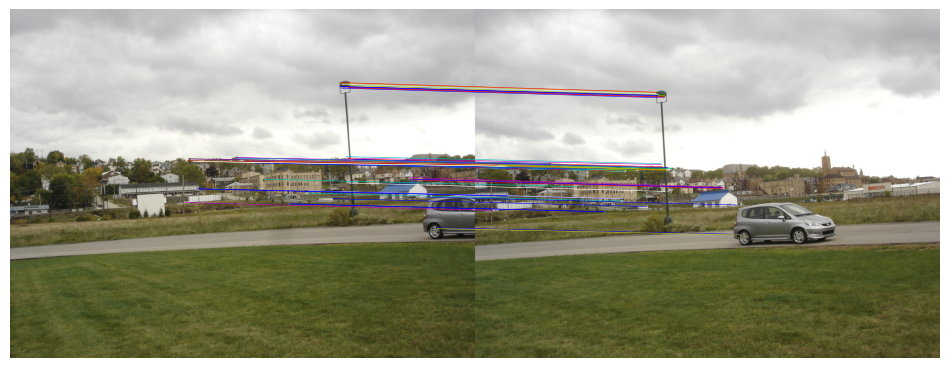

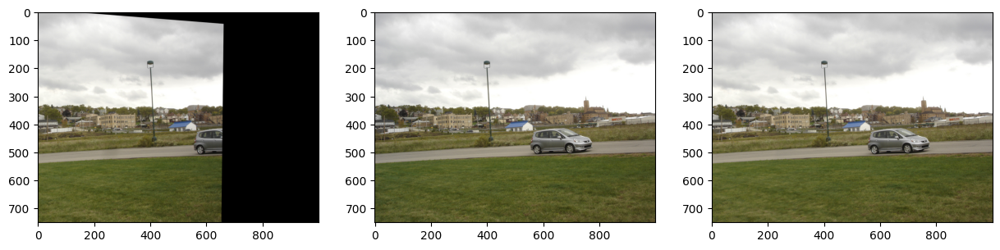

In [ ]:
n_matches = 80
H = tr.ProjectiveTransform()
H.estimate(src_kp[:n_matches], dst_kp[:n_matches])

display_control_lines(source_img,dest_img,src_kp, dst_kp, n_matches)

warped_source_img = tr.warp(source_img, H.inverse,output_shape=dest_img.shape)
fig, ax = plt.subplots(ncols=3,figsize=(15, 6))
ax[0].imshow(warped_source_img )
ax[1].imshow(dest_img)
ax[2].imshow(np.maximum(np.uint8(warped_source_img*255),dest_img))
plt.show()

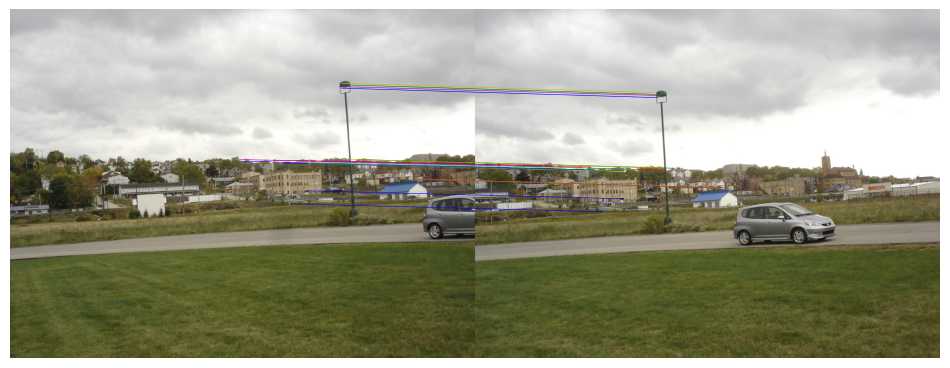

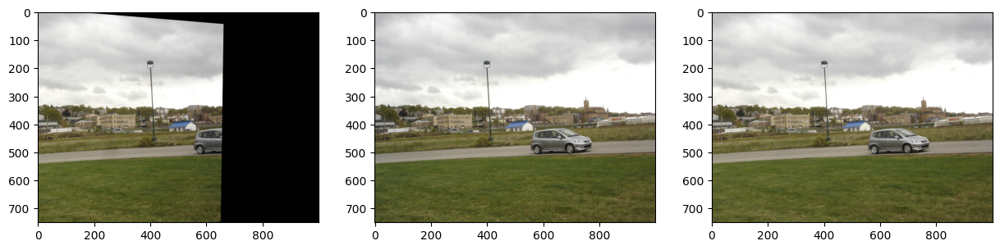

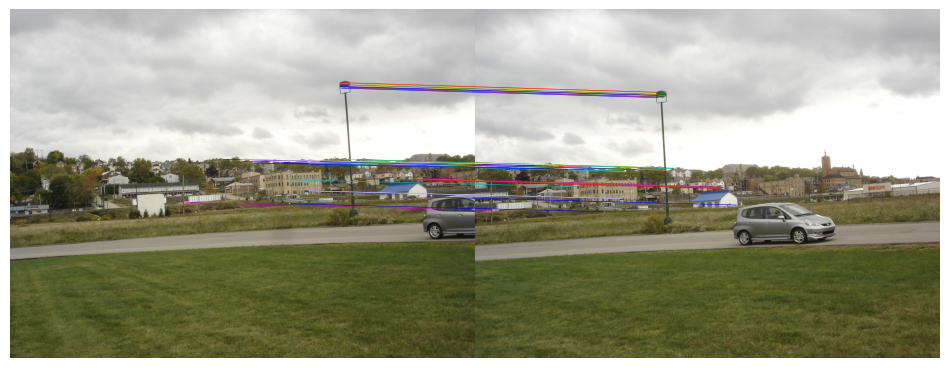

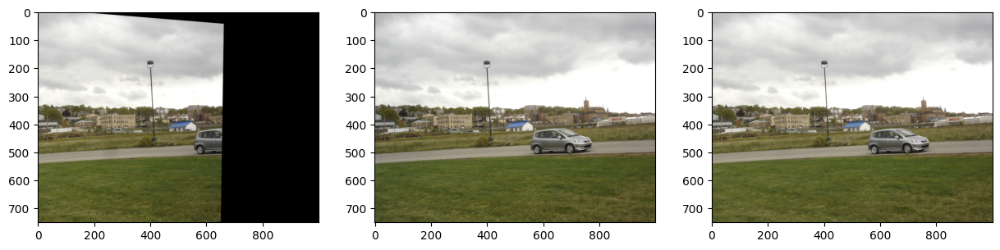

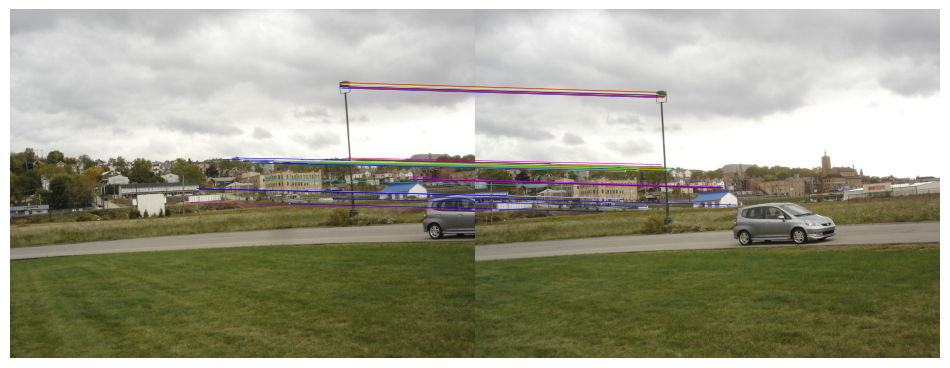

...

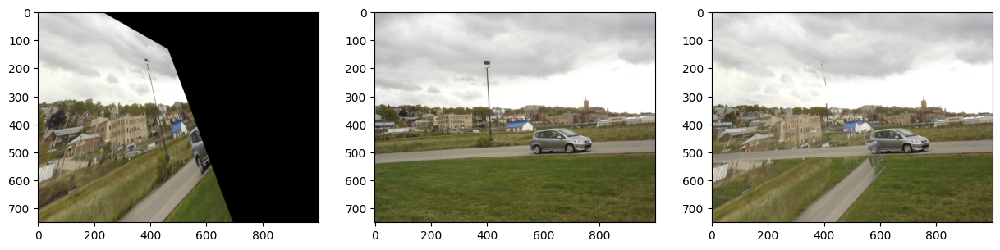

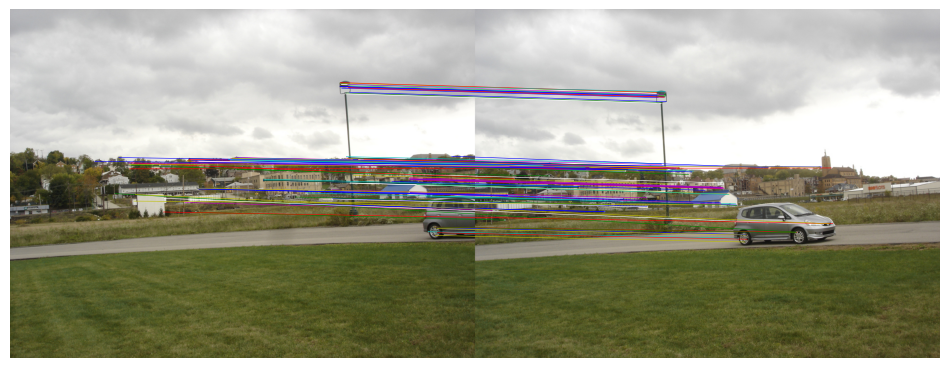

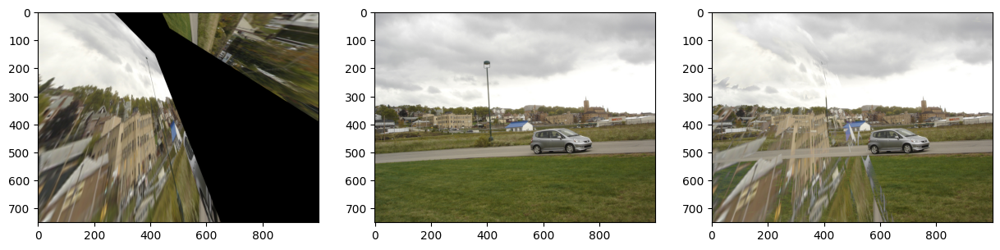

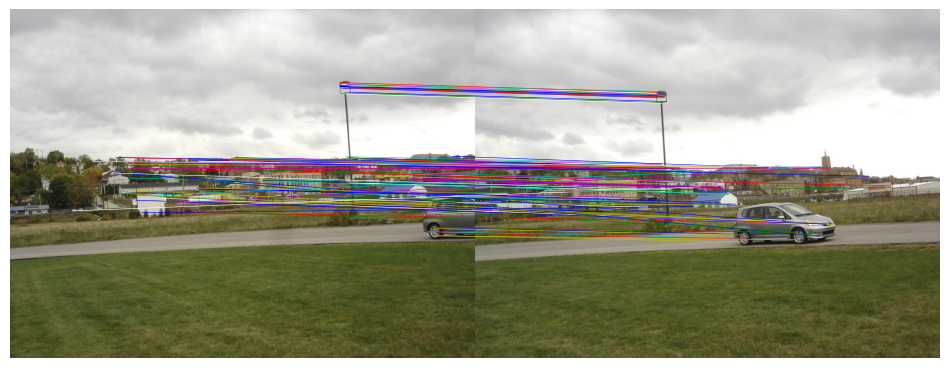

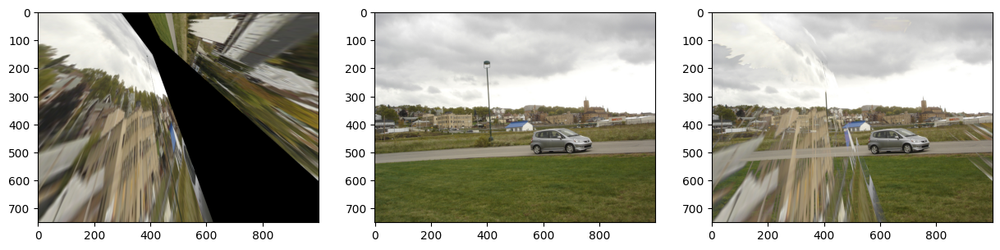

In [ ]:
for n_matches in range(20,220,20):
  H = tr.ProjectiveTransform()
  H.estimate(src_kp[:n_matches], dst_kp[:n_matches])

  display_control_lines(source_img,dest_img,src_kp, dst_kp, n_matches)

  warped_source_img = tr.warp(source_img, H.inverse,output_shape=dest_img.shape)
  fig, ax = plt.subplots(ncols=3,figsize=(15, 6))
  ax[0].imshow(warped_source_img )
  ax[1].imshow(dest_img)
  ax[2].imshow(np.maximum(np.uint8(warped_source_img*255),dest_img))
  plt.show()

**Matching using RANSAC**

The RANSAC algorithm receives the two arrays of points with matching descriptors and finds the homography that approximates the largest number of points.


In [ ]:
H, mask = cv.findHomography(dst_kp, src_kp, cv.RANSAC, .5)

In [ ]:
print(mask.reshape(-1))
print(np.sum(mask),'correspondences found')

[1 1 0 1 1 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 1 1 0 1 1 1 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 1 1 1 1 0 0 1 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0
 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0
 0 0 1 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
45 correspondences found


In [ ]:
mask_pts = np.bool(mask.reshape(-1))

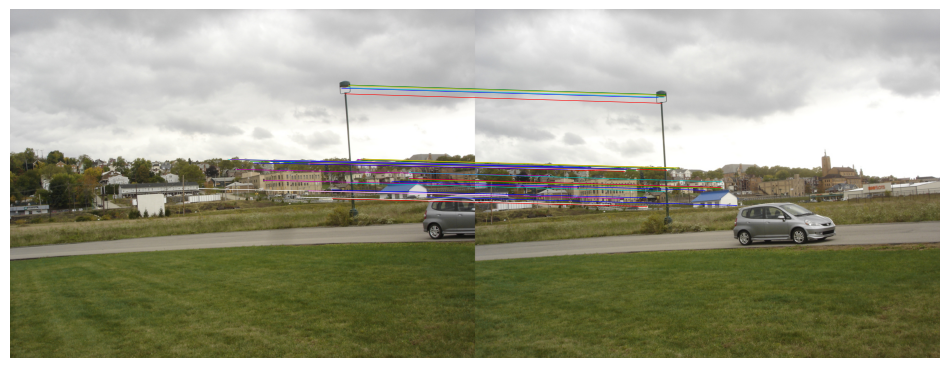

In [ ]:
display_control_lines(source_img,dest_img,src_kp[mask_pts], dst_kp[mask_pts])

Now let's see the rejected matches.

In [ ]:
mask_pts = np.invert(mask_pts)

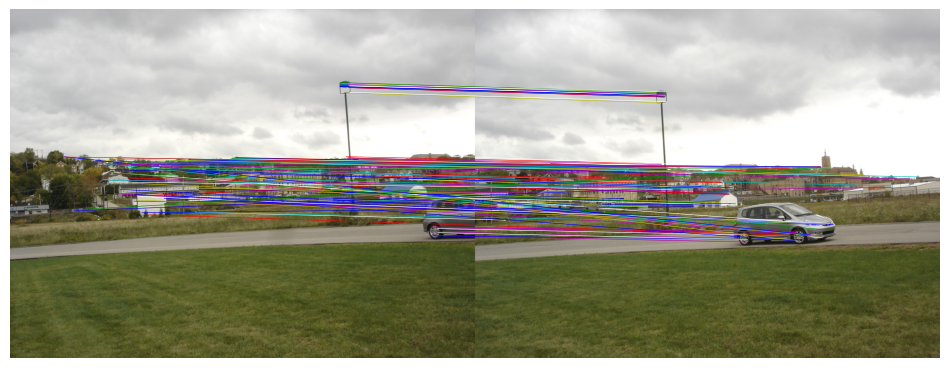

In [ ]:
display_control_lines(source_img,dest_img,src_kp[mask_pts], dst_kp[mask_pts])

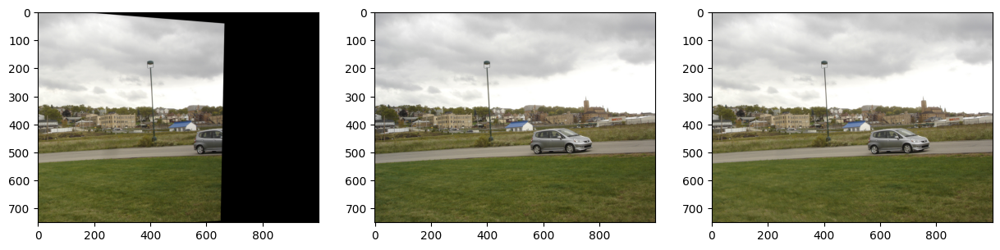

In [ ]:
warped_source_img = tr.warp(source_img, tr.ProjectiveTransform(H),output_shape=dest_img.shape)
fig, ax = plt.subplots(ncols=3,figsize=(15, 6))
ax[0].imshow(warped_source_img )
ax[1].imshow(dest_img)
ax[2].imshow(np.maximum(np.uint8(warped_source_img*255),dest_img))
plt.show()

#**Exercise: Stitching the images together**

Create an image that contains the destination image surrounded by a black frame.

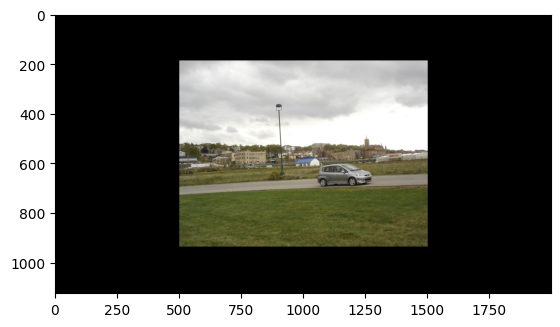

In [ ]:
frame_y = dest_img.shape[0]//4
frame_x = dest_img.shape[1]//2
dest_img_frm =  np.zeros((dest_img.shape[0]+2*frame_y, dest_img.shape[1]+2*frame_x,3),dtype = dest_img.dtype)
dest_img_frm[frame_y:-frame_y,frame_x:-frame_x] = dest_img
plt.imshow(dest_img_frm)

Now repeat the code above with the new destination.

In [ ]:
src_kp, src_desc = get_keypoints_and_descriptors(source_img)
dst_kp, dst_desc = get_keypoints_and_descriptors(dest_img_frm)

In [ ]:
src_index, dst_index, dist = match_descriptors(src_desc,dst_desc,max_matches=500)

In [ ]:
src_kp = src_kp[src_index]
src_desc = src_desc[src_index]

dst_kp = dst_kp[dst_index]
dst_desc = dst_desc[dst_index]

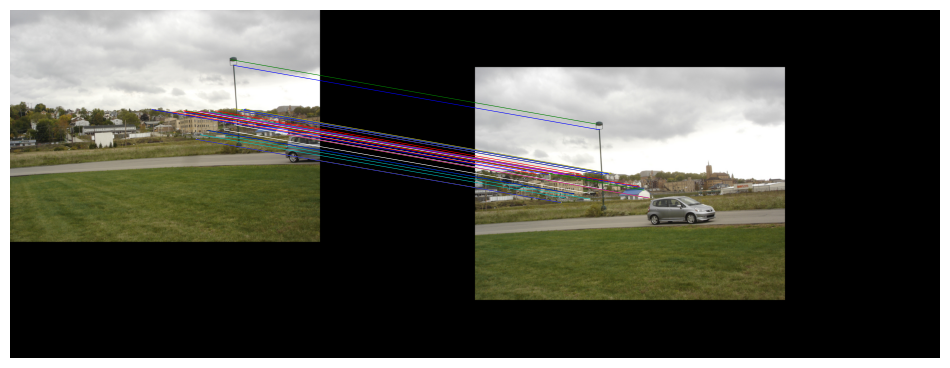

In [ ]:
H, mask = cv.findHomography(dst_kp, src_kp, cv.RANSAC, .5)
mask_pts = np.bool(mask.reshape(-1))
display_control_lines(source_img,dest_img_frm,src_kp[mask_pts], dst_kp[mask_pts])

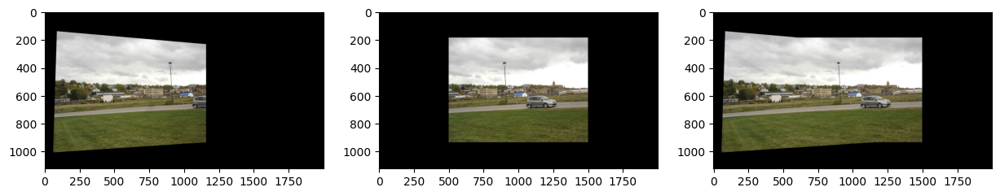

In [ ]:
warped_source_img = tr.warp(source_img, tr.ProjectiveTransform(H),output_shape=dest_img_frm.shape)
dest_img_final = np.maximum(np.uint8(warped_source_img*255),dest_img_frm)
fig, ax = plt.subplots(ncols=3,figsize=(15, 6))
ax[0].imshow(warped_source_img )
ax[1].imshow(dest_img_frm)
ax[2].imshow(dest_img_final)
plt.show()

Finally, also add the third image in the dataset.

In [ ]:
source_img2 = plt.imread('WF03.jpg')

In [ ]:
src_kp, src_desc = get_keypoints_and_descriptors(source_img2)
dst_kp, dst_desc = get_keypoints_and_descriptors(dest_img_final)

src_index, dst_index, dist = match_descriptors(src_desc,dst_desc,max_matches=500)

src_kp = src_kp[src_index]
src_desc = src_desc[src_index]

dst_kp = dst_kp[dst_index]
dst_desc = dst_desc[dst_index]

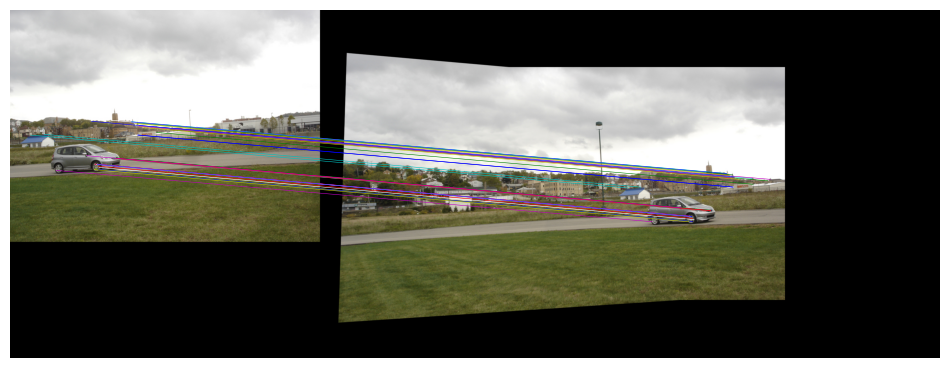

In [ ]:
H, mask = cv.findHomography(dst_kp, src_kp, cv.RANSAC, .5)
mask_pts = np.bool(mask.reshape(-1))
display_control_lines(source_img2,dest_img_final,src_kp[mask_pts], dst_kp[mask_pts])

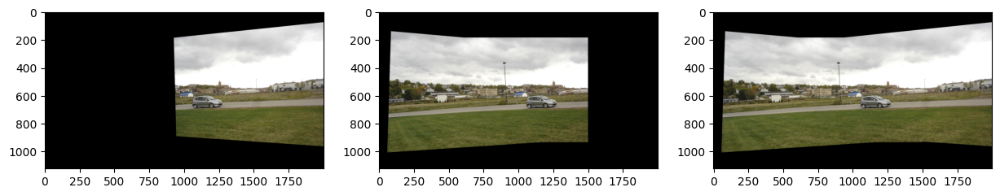

In [ ]:
warped_source_img = tr.warp(source_img2, tr.ProjectiveTransform(H),output_shape=dest_img_final.shape)
fig, ax = plt.subplots(ncols=3,figsize=(15, 6))
ax[0].imshow(warped_source_img )
ax[1].imshow(dest_img_final)
ax[2].imshow(np.maximum(np.uint8(warped_source_img*255),dest_img_final))
plt.show()

For extra credit, make the code work without the need of a predefined black frame, figuring out the size of the destination image from the transformation and the size of the source images.

In [ ]:
def stitch_auto(source_img, dest_img):
    # Match keypoints
    src_kp, src_desc = get_keypoints_and_descriptors(source_img)
    dst_kp, dst_desc = get_keypoints_and_descriptors(dest_img)
    src_index, dst_index, dist = match_descriptors(src_desc, dst_desc, max_matches=500)
    src_kp, dst_kp = src_kp[src_index], dst_kp[dst_index]

    # Find homography
    H, mask = cv.findHomography(dst_kp, src_kp, cv.RANSAC, 0.5)

    # Project source corners into dst space to find canvas bounds
    h_src, w_src = source_img.shape[:2]
    h_dst, w_dst = dest_img.shape[:2]

    corners = np.float32([[0,0],[w_src,0],[w_src,h_src],[0,h_src]]).reshape(-1,1,2)
    projected = cv.perspectiveTransform(corners, np.linalg.inv(H)).reshape(-1,2)

    all_corners = np.vstack([projected, [[0,0],[w_dst,0],[w_dst,h_dst],[0,h_dst]]])
    min_x, min_y = all_corners.min(axis=0).astype(int)
    max_x, max_y = all_corners.max(axis=0).astype(int)

    ox, oy = -min(0, min_x), -min(0, min_y)  # offset so all coords >= 0
    canvas_w, canvas_h = max_x - min_x, max_y - min_y

    # Place dest on canvas, warp source onto it
    canvas = np.zeros((canvas_h, canvas_w, 3), dtype=dest_img.dtype)
    canvas[oy:oy+h_dst, ox:ox+w_dst] = dest_img

    T = np.array([[1,0,ox],[0,1,oy],[0,0,1]], dtype=np.float64)
    warped = tr.warp(source_img, tr.ProjectiveTransform(H @ np.linalg.inv(T)),
                     output_shape=(canvas_h, canvas_w, 3))

    return np.maximum(np.uint8(warped * 255), canvas)

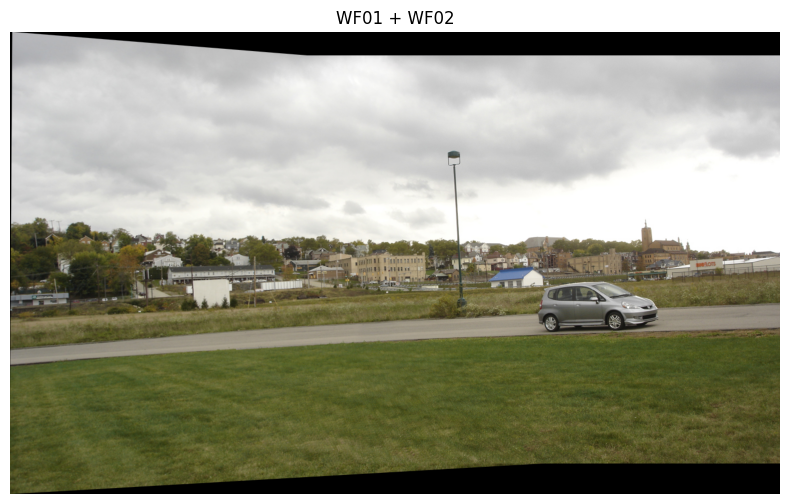

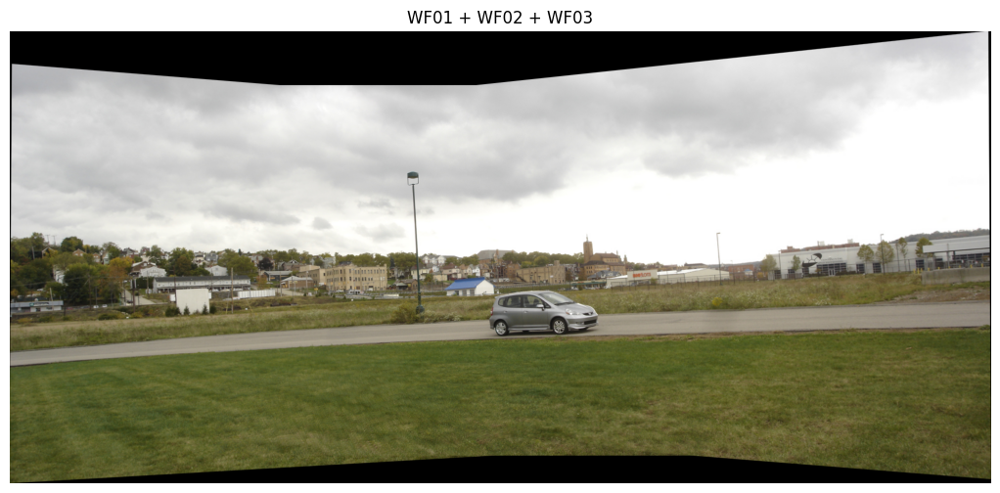

In [ ]:
source_img  = plt.imread('WF01.jpg')
dest_img    = plt.imread('WF02.jpg')
source_img2 = plt.imread('WF03.jpg')

result1 = stitch_auto(source_img, dest_img)

fig, ax = plt.subplots(figsize=(16, 6))
ax.imshow(result1)
ax.axis('off')
plt.title('WF01 + WF02')
plt.show()

result2 = stitch_auto(source_img2, result1)

fig, ax = plt.subplots(figsize=(16, 6))
ax.imshow(result2)
ax.axis('off')
plt.title('WF01 + WF02 + WF03')
plt.show()